In [ ]:
import pandas as pd
import numpy as np
import missingno as msn
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings as fw
fw("ignore")

In [ ]:
#reading files

In [ ]:
noc = pd.read_csv('/content/noc_regions.csv')


In [ ]:
oly = pd.read_csv('/content/athlete_events.csv')

In [ ]:
oly.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN


In [ ]:
noc.head()

,NOC,region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [ ]:
df=oly.merge(noc,on='NOC',how='left')

In [ ]:
df.head(10)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN
5,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,"Speed Skating Women's 1,000 metres",NaN,Netherlands,NaN
6,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN
7,5,Christine Jacoba Aaftink,F,25.0,185.0,82.0,Netherlands,NED,1992 Winter,1992,Winter,Albertville,Speed Skating,"Speed Skating Women's 1,000 metres",NaN,Netherlands,NaN
8,5,Christine Jacoba Aaftink,F,27.0,185.0,82.0,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands,NaN
9,5,Christine Jacoba Aaftink,F,27.0,185.0,82.0,Netherlands,NED,1994 Winter,1994,Winter,Lillehammer,Speed Skating,"Speed Skating Women's 1,000 metres",NaN,Netherlands,NaN


In [ ]:
df.groupby('region')['Medal'].count().nlargest(20).reset_index()

,region,Medal
0,USA,5637
1,Russia,3947
2,Germany,3756
3,UK,2068
4,France,1777
5,Italy,1637
6,Sweden,1536
7,Canada,1352
8,Australia,1349
9,Hungary,1135


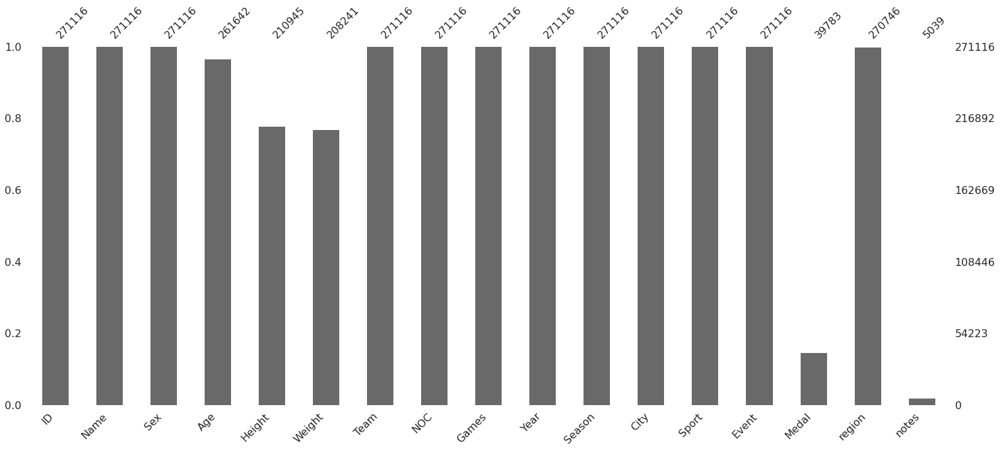

In [ ]:
msn.bar(df)
plt.show()

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,271116.0,68248.954396,39022.286345,1.0,34643.0,68205.0,102097.25,135571.0
Age,261642.0,25.556898,6.393561,10.0,21.0,24.0,28.00,97.0
Height,210945.0,175.338970,10.518462,127.0,168.0,175.0,183.00,226.0
Weight,208241.0,70.702393,14.348020,25.0,60.0,70.0,79.00,214.0
Year,271116.0,1978.378480,29.877632,1896.0,1960.0,1988.0,2002.00,2016.0


In [ ]:
df.isnull().sum()/df.shape[0]

ID        0.000000
Name      0.000000
Sex       0.000000
Age       0.034944
Height    0.221938
Weight    0.231912
Team      0.000000
NOC       0.000000
Games     0.000000
Year      0.000000
Season    0.000000
City      0.000000
Sport     0.000000
Event     0.000000
Medal     0.853262
region    0.001365
notes     0.981414
dtype: float64

In [ ]:
df.drop('notes',axis=1,inplace=True)

In [ ]:
df.head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark
4,5,Christine Jacoba Aaftink,F,21.0,185.0,82.0,Netherlands,NED,1988 Winter,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,NaN,Netherlands


In [ ]:
region_medal=df.groupby('region')['Medal'].count().nlargest(20).reset_index()

In [ ]:
region_medal.head()

,region,Medal
0,USA,5637
1,Russia,3947
2,Germany,3756
3,UK,2068
4,France,1777


In [ ]:
#medals by region barh

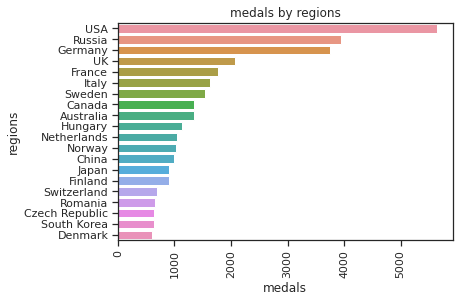

In [ ]:
sns.barplot(y='region',x='Medal',data=region_medal)
plt.title('medals by regions')
plt.xlabel('medals')
plt.ylabel('regions')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df['Medal'].value_counts()

Gold      13372
Bronze    13295
Silver    13116
Name: Medal, dtype: int64

In [ ]:
df[df['Medal']=='Gold'][['Name','region']]

,Name,region
3,Edgar Lindenau Aabye,Denmark
42,Paavo Johannes Aaltonen,Finland
44,Paavo Johannes Aaltonen,Finland
48,Paavo Johannes Aaltonen,Finland
60,Kjetil Andr Aamodt,Norway
...,...,...
270981,Zurab Zviadauri,Georgia
271009,Julia Zwehl,Germany
271016,"Ronald Ferdinand ""Ron"" Zwerver",Netherlands
271049,Henk Jan Zwolle,Netherlands


In [ ]:
#barplot based on medals

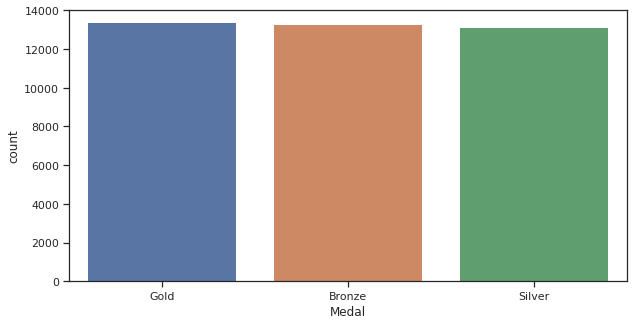

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Medal', data=df)
plt.show()


In [ ]:
participants=df.groupby('Year')['Name'].count().reset_index()
participants
#grouping year and name

,Year,Name
0,1896,380
1,1900,1936
2,1904,1301
3,1906,1733
4,1908,3101
5,1912,4040
6,1920,4292
7,1924,5693
8,1928,5574
9,1932,3321


In [ ]:
reg_medal=df.groupby(['Season','Medal']).size().reset_index()
reg_medal

,Season,Medal,0
0,Summer,Bronze,11409
1,Summer,Gold,11459
2,Summer,Silver,11220
3,Winter,Bronze,1886
4,Winter,Gold,1913
5,Winter,Silver,1896


In [ ]:
#creating indexes

In [ ]:
season=df.groupby(['Year','Season','City'],as_index='False').first()

In [ ]:
season

ID                                Name  \
Year Season City                                                               
1896 Summer Athina                  1724              Aristidis Akratopoulos   
1900 Summer Paris                      4                Edgar Lindenau Aabye   
1904 Summer St. Louis                404         Louis Grenville "Lou" Abell   
1906 Summer Athina                   139              George "Ioannis" Abbot   
1908 Summer London                   635                     Alfredo Accorsi   
1912 Summer Stockholm                 15                Arvo Ossian Aaltonen   
1920 Summer Antwerpen                  3                 Gunnar Nielsen Aaby   
1924 Summer Paris                     15                Arvo Ossian Aaltonen   
     Winter Chamonix                 391                  Clarence John Abel   
1928 Summer Amsterdam                 47                Erling Rudolf Aastad   
     Winter Sankt Moritz             529     Karl Gustaf Emanuel Abrahamsson   
1932 Summer Los Angeles                8  Cornelia "Cor" Aalten (-Strannood)   
     Winter Lake Placid              746                         Goro Adachi   
1936 Summer Berlin                    31                   Evald rma (rman-)   
     Winter Garmisch-Partenkirchen   746                         Goro Adachi   
1948 Summer London                    17             Paavo Johannes Aaltonen   
     Winter Sankt Moritz             665               Gilbert Achard-Picard   
1952 Summer Helsinki                  10      Einar Ferdinand "Einari" Aalto   
     Winter Oslo                      40                     Roald Edgar Aas   
1956 Summer Melbourne                 46                          Hans Aasns   
            Stockholm               3479     Karl Vilhelm Nordstrm Ammitzbll   
     Winter Cortina d'Ampezzo         40                     Roald Edgar Aas   
1960 Summer Roma                      46                          Hans Aasns   
     Winter Squaw Valley              24                    Nils Egil Aaness   
1964 Summer Tokyo                     87        Rost'om Omeris dze Abashidze   
     Winter Innsbruck                 24                    Nils Egil Aaness   
1968 Summer Mexico City               28                    Jan-Erik Aarberg   
     Winter Grenoble                 137           Giordano Giulio Abbondati   
1972 Summer Munich                    28                    Jan-Erik Aarberg   
     Winter Sapporo                  363                          Kazumi Abe   
1976 Summer Montreal                  52                       Patrick Abada   
     Winter Innsbruck                363                          Kazumi Abe   
1980 Summer Moskva                    85             Alejandro Abascal Garca   
     Winter Lake Placid               11                  Jorma Ilmari Aalto   
1984 Summer Los Angeles               27                       Johan Aantjes   
     Winter Sarajevo                  26        Agnes Erika Aanonsen (-Eyde)   
1988 Summer Seoul                     29                Willemien Aardenburg   
     Winter Calgary                    5            Christine Jacoba Aaftink   
1992 Summer Barcelona                  1                           A Dijiang   
     Winter Albertville                5            Christine Jacoba Aaftink   
1994 Winter Lillehammer                5            Christine Jacoba Aaftink   
1996 Summer Atlanta                   13                  Minna Maarit Aalto   
1998 Winter Nagano                    20                  Kjetil Andr Aamodt   
2000 Summer Sydney                    12                   Jyri Tapani Aalto   
2002 Winter Salt Lake City             9                    Antti Sami Aalto   
2004 Summer Athina                    23                         Fritz Aanes   
2006 Winter Torino                    20                  Kjetil Andr Aamodt   
2008 Summer Beijing                   21           Ragnhild Margrethe Aamodt   
2010 Winter Vancouver                1

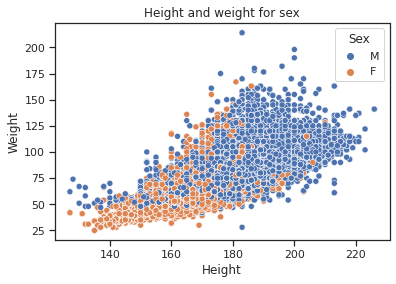

In [ ]:
sns.scatterplot(x='Height',y='Weight',hue='Sex',data=df)
plt.title('Height and weight for sex')
plt.show()
#scatter plot of height and weight based on sex

In [ ]:
#grouping and plotting women's olympics 

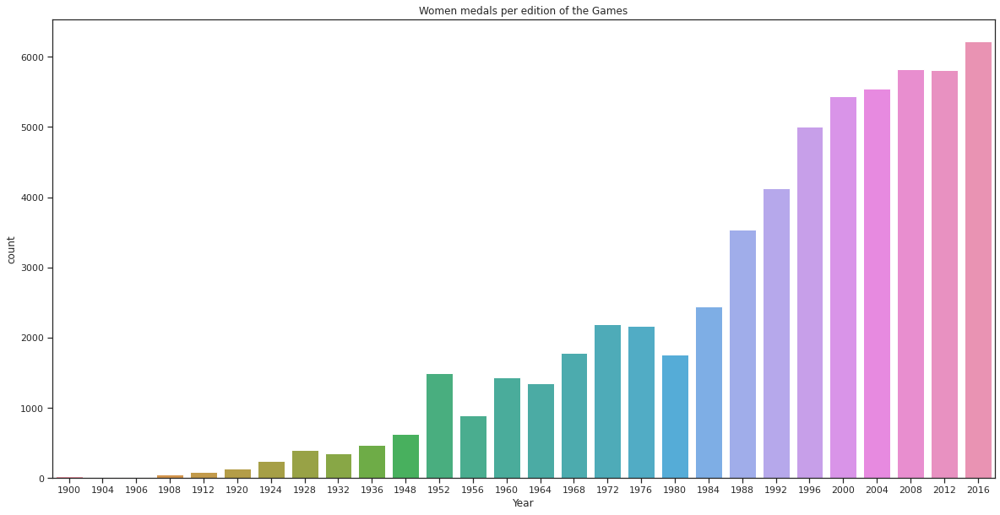

In [ ]:
womenolympics = df[(df.Sex == 'F') &
                         (df.Season == 'Summer')]
plt.figure(figsize=(20, 10))
sns.countplot(x='Year', data=womenolympics)
plt.title('Women medals per edition of the Games')
plt.show()

In [ ]:
sport=df['Sport'].value_counts()[:5]
print(sport)

Athletics     38624
Gymnastics    26707
Swimming      23195
Shooting      11448
Cycling       10859
Name: Sport, dtype: int64


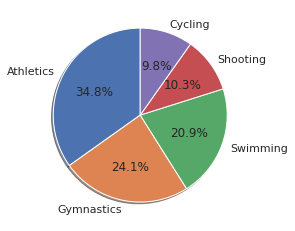

In [ ]:
labels=sport.index
sizes=sport.values
plt.pie(sizes,labels=labels,autopct='%1.1f%%',
        shadow=True,startangle=90)
plt.show()
#pie visualization for sports

In [ ]:
sport_summer=df[df['Season']=='Summer']['Sport'].value_counts().sort_values(ascending=False).head(20)

In [ ]:
sport_summer.head()

Athletics     38624
Gymnastics    26707
Swimming      23195
Shooting      11448
Cycling       10859
Name: Sport, dtype: int64

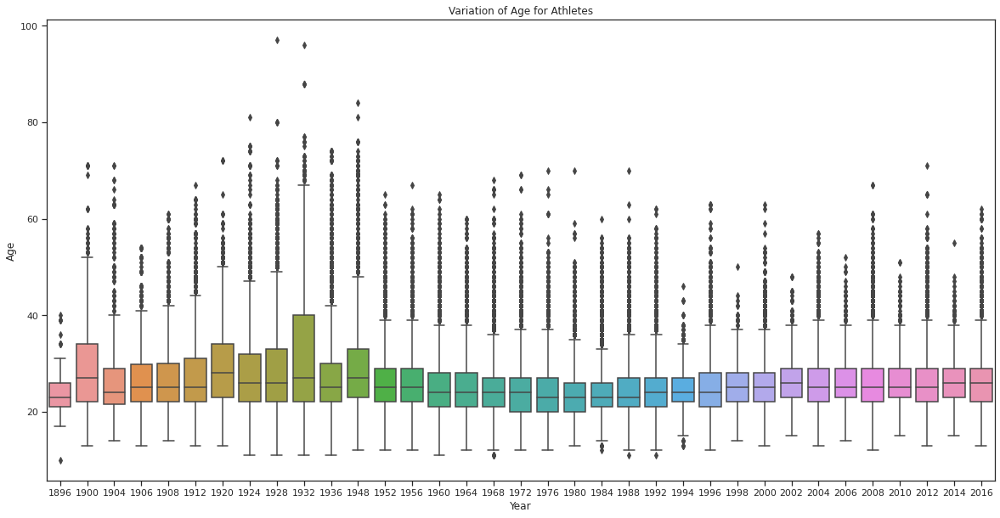

In [ ]:
plt.figure(figsize=(20,10))
sns.boxplot(x='Year', y='Age', data=df)
plt.title('Variation of Age for Athletes')
plt.show()

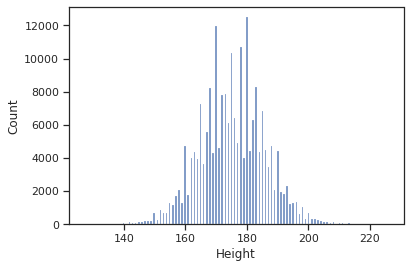

In [ ]:
sns.histplot(data=df, x="Height")

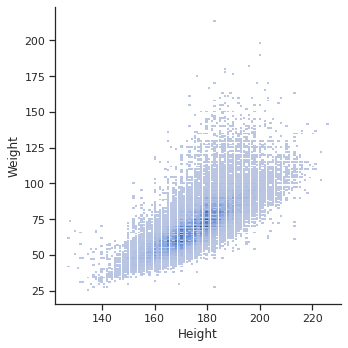

In [ ]:
sns.displot(data=df, x="Height", y="Weight")


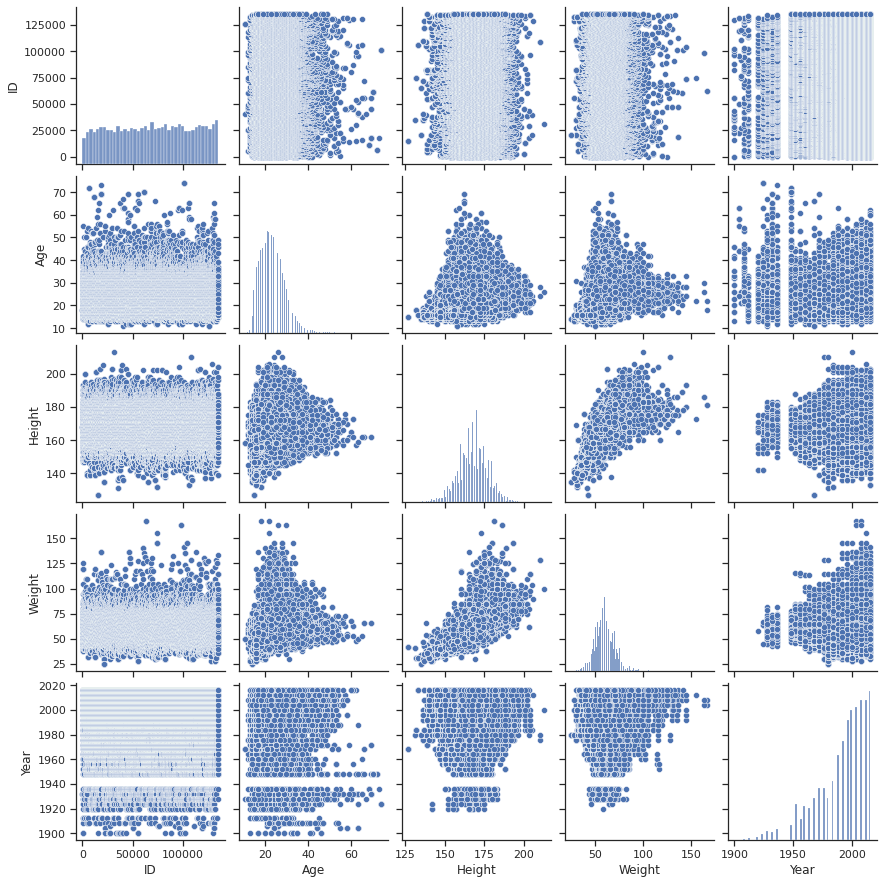

In [ ]:
sns.pairplot(womenolympics)

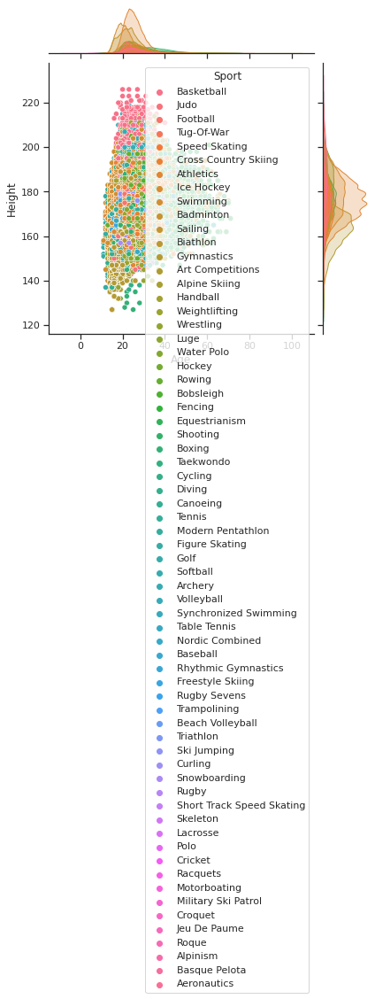

In [ ]:
sns.jointplot(data=df, x="Age", y="Height", hue="Sport")

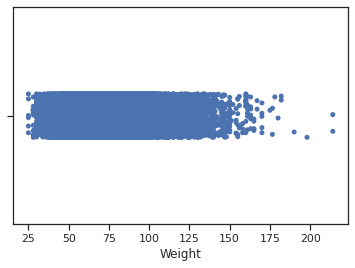

In [ ]:
sns.stripplot(data=df, x="Weight", hue="Sport")

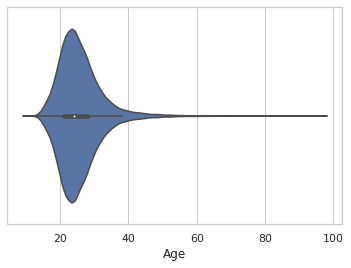

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x="Age",data=df)

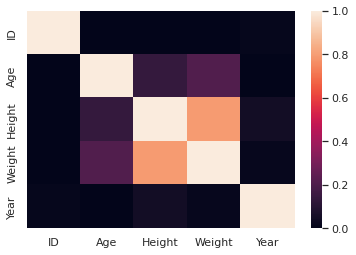

In [ ]:
ax1 = sns.heatmap(df.corr(), vmin=0, vmax=1, data=df)

In [ ]:
df1=pd.read_csv('/content/noc_regions.csv')
df1.rename(
    columns=({'region': 'Region'}),
    inplace = True,
)
df1.head()

,NOC,Region,notes
0,AFG,Afghanistan,NaN
1,AHO,Curacao,Netherlands Antilles
2,ALB,Albania,NaN
3,ALG,Algeria,NaN
4,AND,Andorra,NaN


In [ ]:
#knn

In [ ]:
df2=oly.merge(noc,on='NOC',how='left')

In [ ]:
#feature extraction

In [ ]:
boy_kilo_list = ["Height","Weight"]
unique_team=pd.unique(df.Team)
for e in unique_team:
    team_fil = df.Team == e
    data_fil = df[team_fil]
    
    for s in boy_kilo_list:
        agemean = np.round(np.mean(data_fil[s]),2)
        if ~np.isnan(agemean):
            data_fil[s]=data_fil[s].fillna(agemean)
        else:
            data_fil[s]=data_fil[s].fillna(np.round(np.mean(df[s]),2))
    df[team_fil]=data_fil


In [ ]:
age_list = ["Age"]
unique_Season=pd.unique(df.Season)
for e in unique_Season:
    team_fil = df.Season == e
    data_fil = df[team_fil]
    
    for s in age_list:
        agemean = np.round(np.mean(data_fil[s]),2)
        if ~np.isnan(agemean):
            data_fil[s]=data_fil[s].fillna(agemean)
        else:
            data_fil[s]=data_fil[s].fillna(np.round(np.mean(df[s]),2))
    df[team_fil]=data_fil

In [ ]:
df.drop(["ID","Games","NOC"],axis=1,inplace=True)

df["SeasonSayı"]=df["Season"].astype("category").cat.codes
df["SexSayı"]=df["Sex"].astype("category").cat.codes

df["Medal"]=df["Medal"].fillna("---")
#df.drop(["Medal"],axis=1,inplace=True)
df.replace({"Gold":3,"Bronze":2,"Silver":1})

,Name,Sex,Age,Height,Weight,Team,Year,Season,City,Sport,Event,Medal,region,SeasonSayı,SexSayı
0,A Dijiang,M,24.0,180.00,80.00,China,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,---,China,0,1
1,A Lamusi,M,23.0,170.00,60.00,China,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,---,China,0,1
2,Gunnar Nielsen Aaby,M,24.0,179.22,73.89,Denmark,1920,Summer,Antwerpen,Football,Football Men's Football,---,Denmark,0,1
3,Edgar Lindenau Aabye,M,34.0,175.37,70.72,Denmark/Sweden,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,3,Denmark,0,1
4,Christine Jacoba Aaftink,F,21.0,185.00,82.00,Netherlands,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,---,Netherlands,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,Andrzej ya,M,29.0,179.00,89.00,Poland-1,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,---,Poland,1,1
271112,Piotr ya,M,27.0,176.00,59.00,Poland,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",---,Poland,1,1
271113,Piotr ya,M,27.0,176.00,59.00,Poland,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",---,Poland,1,1
271114,Tomasz Ireneusz ya,M,30.0,185.00,96.00,Poland,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,---,Poland,1,1


In [ ]:
#calculating bmi


In [ ]:
df["BMI"] = df["Weight"]/(df["Height"].div(100)*2)

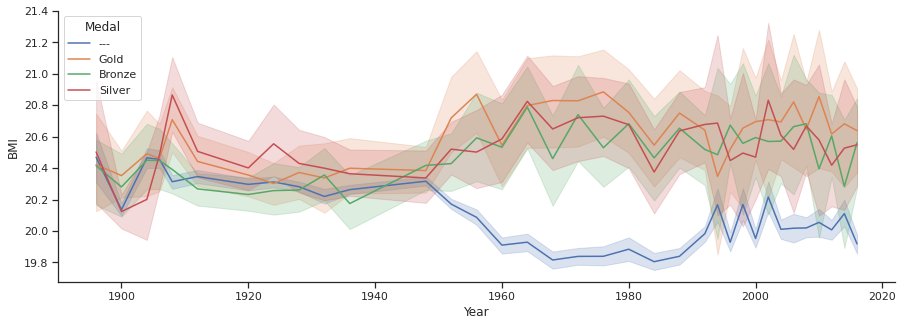

In [ ]:
#plotting the graph based on year related to the bmi classified according to the medal
plt.figure(figsize=(15,5))
sns.set_theme(style="ticks")          
sns.lineplot(x=df.Year,y=df.BMI,hue=df.Medal)
sns.despine(bottom=False,left=False)

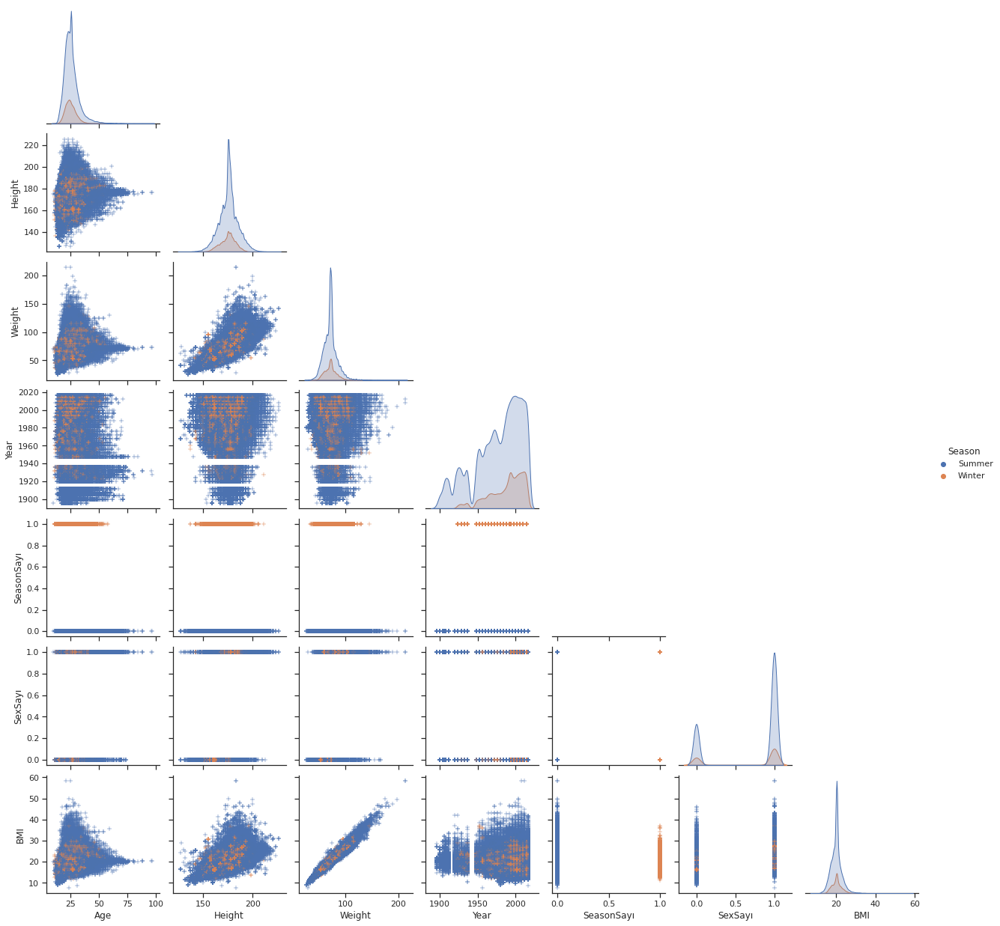

In [ ]:
sns.pairplot(df,markers="+",corner=True,hue="Season");

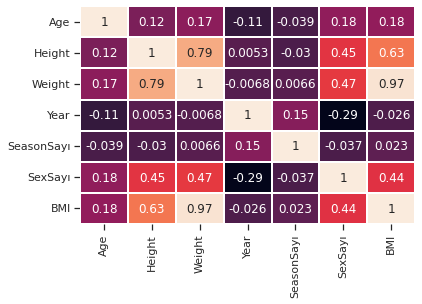

In [ ]:
#heat map to show the correlation between the indexes

sns.heatmap(df.corr(),linewidths=1,annot=True,cbar=False);
plt.yticks(rotation=0);

In [ ]:
df.isnull().sum()  

Name            0
Sex             0
Age             0
Height          0
Weight          0
Team            0
Year            0
Season          0
City            0
Sport           0
Event           0
Medal           0
region        370
SeasonSayı      0
SexSayı         0
BMI             0
dtype: int64

In [ ]:

#from sklearn.preprocessing import MinMaxScaler

#mmscaler=MinMaxScaler()
#cols = ['Age','Height','Weight']
#df[cols] = mmscaler.fit_transform(df[cols])

In [ ]:
from sklearn.preprocessing import RobustScaler,StandardScaler
from sklearn.metrics import mean_absolute_error,classification_report,confusion_matrix
from sklearn.model_selection import train_test_split,cross_val_score

In [ ]:
df

,Name,Sex,Age,Height,Weight,Team,Year,Season,City,Sport,Event,Medal,region,SeasonSayı,SexSayı,BMI
0,A Dijiang,M,24.0,180.00,80.00,China,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,---,China,0,1,22.222222
1,A Lamusi,M,23.0,170.00,60.00,China,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,---,China,0,1,17.647059
2,Gunnar Nielsen Aaby,M,24.0,179.22,73.89,Denmark,1920,Summer,Antwerpen,Football,Football Men's Football,---,Denmark,0,1,20.614329
3,Edgar Lindenau Aabye,M,34.0,175.37,70.72,Denmark/Sweden,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,0,1,20.163084
4,Christine Jacoba Aaftink,F,21.0,185.00,82.00,Netherlands,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,---,Netherlands,1,0,22.162162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,Andrzej ya,M,29.0,179.00,89.00,Poland-1,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,---,Poland,1,1,24.860335
271112,Piotr ya,M,27.0,176.00,59.00,Poland,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",---,Poland,1,1,16.761364
271113,Piotr ya,M,27.0,176.00,59.00,Poland,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",---,Poland,1,1,16.761364
271114,Tomasz Ireneusz ya,M,30.0,185.00,96.00,Poland,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,---,Poland,1,1,25.945946


In [ ]:
df1 = df.copy()
x = df1[["BMI","SexSayı","SeasonSayı","Age"]]
y = df1["Medal"]
xx = x.copy()
yy = y.copy()

rs = RobustScaler()
ss = StandardScaler()

x[["BMI","Age"]] = rs.fit_transform(x[["BMI","Age"]])
xx[["BMI","Age"]] = ss.fit_transform(xx[["BMI","Age"]])
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)
xx_train,xx_test,yy_train,yy_test = train_test_split(xx,yy,test_size=0.2,random_state=42)

In [ ]:
x_train


,BMI,SexSayı,SeasonSayı,Age
97952,-0.010942,1,0,1.000000
151066,-0.335845,1,0,-1.166667
13248,-2.366422,0,0,0.666667
5803,-0.383783,0,0,-1.000000
249601,0.146088,1,0,-0.333333
...,...,...,...,...
119879,0.782105,1,0,-0.166667
259178,0.133196,1,0,3.333333
131932,1.181888,1,0,0.666667
146867,-0.675062,0,0,-1.500000


In [ ]:
xx_train

,BMI,SexSayı,SeasonSayı,Age
97952,-0.014005,1,0,0.866088
151066,-0.329318,1,0,-1.203679
13248,-2.299953,0,0,0.547662
5803,-0.375840,0,0,-1.044466
249601,0.138390,1,0,-0.407615
...,...,...,...,...
119879,0.755632,1,0,-0.248402
259178,0.125878,1,0,3.095067
131932,1.143614,1,0,0.547662
146867,-0.658521,0,0,-1.522104


In [ ]:
#knn classification

from sklearn.neighbors import KNeighborsClassifier

In [ ]:
from sklearn.metrics import accuracy_score
knn_model = KNeighborsClassifier(n_neighbors=20,p=1).fit(x_train,y_train)
knn_pred = knn_model.predict(x_test)
acc = accuracy_score(y_test,knn_pred)
print(acc)

0.8535703747418117


In [ ]:
knn_modell = KNeighborsClassifier(n_neighbors=20,p=2).fit(xx_train,yy_train)
knn_predd = knn_modell.predict(xx_test)
acc1 = accuracy_score(y_test,knn_pred)
print(acc1)

0.8535703747418117


In [ ]:
print("---------------------------------------------------------------")
print("KNN")
print(classification_report(y_test,knn_pred))
print("---------------------------------------------------------------")

---------------------------------------------------------------
KNN
              precision    recall  f1-score   support

         ---       0.85      1.00      0.92     46290
      Bronze       0.60      0.00      0.00      2692
        Gold       0.33      0.00      0.00      2639
      Silver       0.15      0.00      0.00      2603

    accuracy                           0.85     54224
   macro avg       0.49      0.25      0.23     54224
weighted avg       0.78      0.85      0.79     54224

---------------------------------------------------------------


In [ ]:
print("---------------------------------------------------------------")
print("KNN ss")
print(classification_report(yy_test,knn_predd))
print("---------------------------------------------------------------")

---------------------------------------------------------------
KNN ss
              precision    recall  f1-score   support

         ---       0.85      1.00      0.92     46290
      Bronze       0.60      0.00      0.00      2692
        Gold       0.33      0.00      0.00      2639
      Silver       0.15      0.00      0.00      2603

    accuracy                           0.85     54224
   macro avg       0.49      0.25      0.23     54224
weighted avg       0.78      0.85      0.79     54224

---------------------------------------------------------------


In [ ]:
cm= confusion_matrix(y_test, knn_pred)

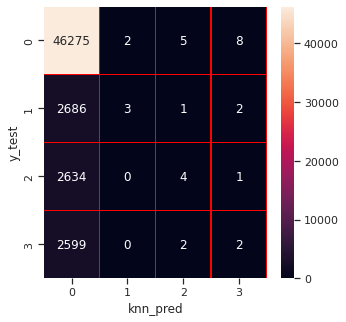

In [ ]:
#confusion matrix vizualization

import seaborn as sns 
f, ax =plt.subplots(figsize = (5,5))

sns.heatmap(cm,annot = True, linewidths= 0.5, linecolor="red", fmt=".0f", ax=ax)
plt.xlabel("knn_pred")
plt.ylabel("y_test")
plt.show()

In [ ]:
# p=1 manhattan
# p=2 euclidean
# no p minkowski

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
y_pred = gnb.fit(x_train, y_train).predict(x_test)
print("Number of mislabeled points out of a total %d points : %d"  % (x_test.shape[0], (y_test != y_pred).sum()))

Number of mislabeled points out of a total 54224 points : 7967


In [ ]:
from sklearn import metrics
print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(y_test, y_pred)*100)

Gaussian Naive Bayes model accuracy(in %): 85.30724402478607


In [ ]:
#kmeans clustering

#clustering based on height and weight of players clustered by winners and non winners

In [ ]:
from sklearn.cluster import KMeans
import statsmodels.api as sm

In [ ]:
AgeMean = int(df['Age'].mean())
print('Age Mean', AgeMean)
df['Age'] = df['Age'].fillna(AgeMean)
df['Age'].isna().sum()

Age Mean 25


0

In [ ]:
HeightMode = df['Height'].mode()[0] ## 0 -> the column wise mode 
print('Height Mode',HeightMode)
df['Height'] = df['Height'].fillna(HeightMode)
df['Height'].isna().sum()

Height Mode 180.0


0

In [ ]:
WeightMode = df['Weight'].mode()[0]
print('Weight Mode',WeightMode)
df['Weight'] = df['Weight'].fillna(WeightMode)
df['Weight'].isna().sum()

Weight Mode 70.0


0

In [ ]:
##The Medal column has NaN values if no medal is won , we Substitute the NaN values with a string 'None'

df['Medal'] = df['Medal'].fillna('None')
df['Medal'].isna().sum()

0

In [ ]:
df['HeightNorm'] = (df['Height']-df['Height'].mean())/np.std(df['Height'],axis = 0)
df['WeightNorm'] = (df['Weight']-df['Weight'].mean())/np.std(df['Weight'],axis = 0)

In [ ]:
## Input for K Means Algo
### Creating dataset for the winners alone
med = ['Gold','Silver','Bronze']
Height_Weight_Win = df[df.Medal.isin(med)]
Height_Weight_Win = Height_Weight_Win[['HeightNorm','WeightNorm']]

### Creating dataset for all the players based on height and weight norms
Height_Weight= df[['HeightNorm','WeightNorm']]

Height_Weight.head()

,HeightNorm,WeightNorm
0,0.486868,0.723780
1,-0.581317,-0.855145
2,0.403550,0.241418
3,-0.007702,-0.008842
4,1.020961,0.881672


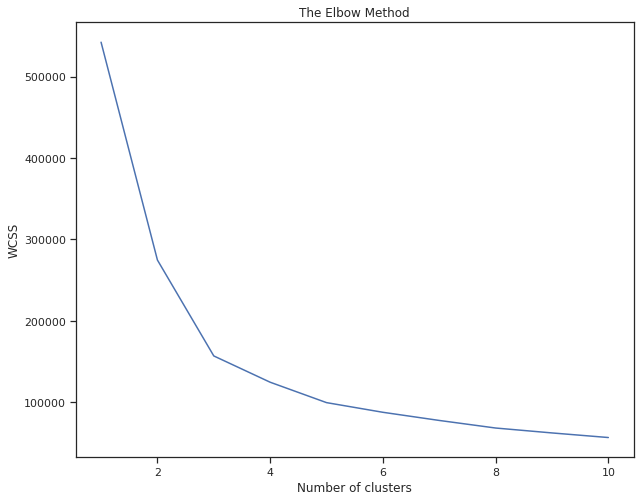

<Figure size 720x576 with 0 Axes>

<Figure size 720x576 with 0 Axes>

In [ ]:
# finding the appropriate cluster number
plt.figure(figsize=(10, 8))
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(Height_Weight)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()
plt.figure(figsize=(10, 8))

In [ ]:
# Fitting K-Means to the dataset taking cluster value 3
from mpl_toolkits.mplot3d import Axes3D

kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(Height_Weight)

centroids = kmeans.cluster_centers_

In [ ]:
#beginning of  the cluster numbering with 1 instead of 0
y_kmeans1=y_kmeans
y_kmeans1=y_kmeans+1
# New Dataframe called cluster
cluster = pd.DataFrame(y_kmeans1)
# Adding cluster to the Dataset1
Height_Weight['cluster'] = cluster

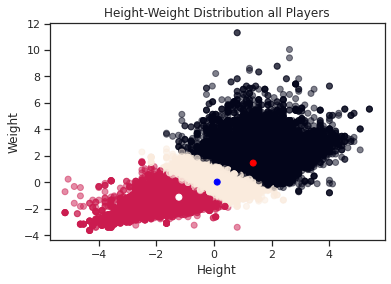

In [ ]:
#Plotting Mean of clusters based on height and weight distribution of players
kmeans_mean_cluster = pd.DataFrame(round(Height_Weight.groupby('cluster').mean(),1))
kmeans_mean_cluster

plt.title('Height-Weight Distribution all Players')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.scatter(Height_Weight['HeightNorm'], Height_Weight['WeightNorm'], c= kmeans.labels_.astype(float), alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c=['red','white','blue'])


plt.show()

In [ ]:
#participants winning medals

Height_Weight_Win = Height_Weight_Win[['HeightNorm','WeightNorm']]

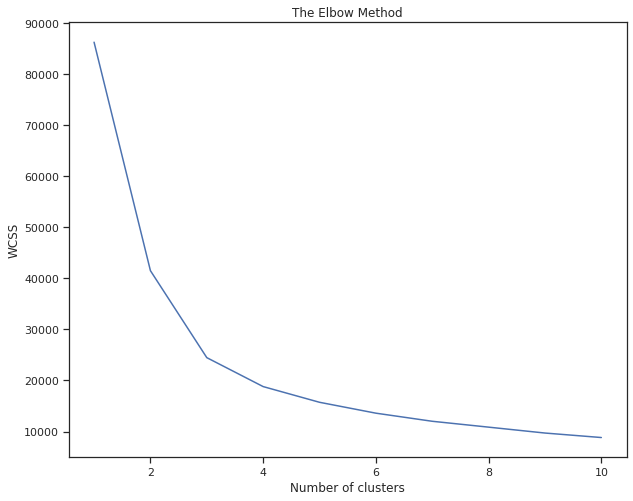

In [ ]:
# find the appropriate cluster number
plt.figure(figsize=(10, 8))
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(Height_Weight_Win)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


In [ ]:
# Fitting K-Means to the dataset
from mpl_toolkits.mplot3d import Axes3D
plt.figure(figsize=(10, 8))

kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(Height_Weight_Win)

centroids = kmeans.cluster_centers_

<Figure size 720x576 with 0 Axes>

In [ ]:
#beginning of  the cluster numbering with 1 instead of 0
y_kmeans1=y_kmeans
y_kmeans1=y_kmeans+1
# New Dataframe called cluster
cluster = pd.DataFrame(y_kmeans1)

In [ ]:
# Adding cluster to the Dataset1
Height_Weight_Win['cluster'] = cluster

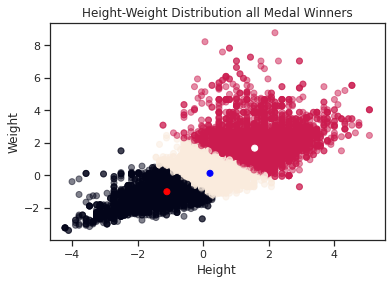

In [ ]:
#Mean of clusters
kmeans_mean_cluster = pd.DataFrame(round(Height_Weight_Win.groupby('cluster').mean(),1))
kmeans_mean_cluster

plt.title('Height-Weight Distribution all Medal Winners')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.scatter(Height_Weight_Win['HeightNorm'], Height_Weight_Win['WeightNorm'], c= kmeans.labels_.astype(float), alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c=['red','white','blue'])
plt.show()

In [ ]:
#clustering based on height and weight of players clustered by winners and non winners
#Both of them follow a similar distribution, and hence the winners and non-winners do not show a huge difference in their height and weight. This shows that, taking the height and weight into considerence, all the players have almost equally likely chances to win a medal.

clustering based on height and weight of players clustered by winners and non winners
Both of them follow a similar distribution, and hence the winners and non-winners do not show a huge difference in their height and weight. This shows that, taking the height and weight into considerence, all the players have almost equally likely chances to win a medal.

Hierarchical ***Clustering***

In [ ]:
df

,Name,Sex,Age,Height,Weight,Team,Year,Season,City,Sport,Event,Medal,region,SeasonSayı,SexSayı,BMI,HeightNorm,WeightNorm
0,A Dijiang,M,24.0,180.00,80.00,China,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,---,China,0,1,22.222222,0.486868,0.723780
1,A Lamusi,M,23.0,170.00,60.00,China,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,---,China,0,1,17.647059,-0.581317,-0.855145
2,Gunnar Nielsen Aaby,M,24.0,179.22,73.89,Denmark,1920,Summer,Antwerpen,Football,Football Men's Football,---,Denmark,0,1,20.614329,0.403550,0.241418
3,Edgar Lindenau Aabye,M,34.0,175.37,70.72,Denmark/Sweden,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,0,1,20.163084,-0.007702,-0.008842
4,Christine Jacoba Aaftink,F,21.0,185.00,82.00,Netherlands,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,---,Netherlands,1,0,22.162162,1.020961,0.881672
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271111,Andrzej ya,M,29.0,179.00,89.00,Poland-1,1976,Winter,Innsbruck,Luge,Luge Mixed (Men)'s Doubles,---,Poland,1,1,24.860335,0.380050,1.434296
271112,Piotr ya,M,27.0,176.00,59.00,Poland,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Individual",---,Poland,1,1,16.761364,0.059594,-0.934092
271113,Piotr ya,M,27.0,176.00,59.00,Poland,2014,Winter,Sochi,Ski Jumping,"Ski Jumping Men's Large Hill, Team",---,Poland,1,1,16.761364,0.059594,-0.934092
271114,Tomasz Ireneusz ya,M,30.0,185.00,96.00,Poland,1998,Winter,Nagano,Bobsleigh,Bobsleigh Men's Four,---,Poland,1,1,25.945946,1.020961,1.986919


In [ ]:
df2=oly.sample(1000)

In [ ]:
x = df2.iloc[:, [0, 9]].values  

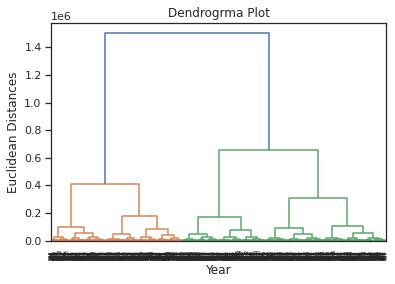

In [ ]:
#Finding the optimal number of clusters using the dendrogram  
import scipy.cluster.hierarchy as shc  
dendro = shc.dendrogram(shc.linkage(x, method="ward"))  
plt.title("Dendrogrma Plot")  
plt.ylabel("Euclidean Distances")  
plt.xlabel("Year")  
plt.show()  

In [ ]:
df2.dropna()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
103661,52442,Joel Isasi Gonzlez,M,24.0,167.0,69.0,Cuba,CUB,1992 Summer,1992,Summer,Barcelona,Athletics,Athletics Men's 4 x 100 metres Relay,Bronze
231642,116208,Noriko Sugawara-Narazaki,F,27.0,157.0,52.0,Japan,JPN,2000 Summer,2000,Summer,Sydney,Judo,Judo Women's Half-Lightweight,Silver
244415,122393,Naoki Tsukahara,M,23.0,180.0,75.0,Japan,JPN,2008 Summer,2008,Summer,Beijing,Athletics,Athletics Men's 4 x 100 metres Relay,Silver
91415,46344,Artem Harutyunyan,M,25.0,172.0,64.0,Germany,GER,2016 Summer,2016,Summer,Rio de Janeiro,Boxing,Boxing Men's Light-Welterweight,Bronze
241390,120913,Alberto Tomba,M,21.0,182.0,92.0,Italy,ITA,1988 Winter,1988,Winter,Calgary,Alpine Skiing,Alpine Skiing Men's Slalom,Gold
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75723,38444,Romano Garagnani,M,31.0,174.0,69.0,Italy,ITA,1968 Summer,1968,Summer,Mexico City,Shooting,Shooting Mixed Skeet,Silver
213668,107297,"Verena ""Vreni"" Schneider",F,29.0,170.0,68.0,Switzerland,SUI,1994 Winter,1994,Winter,Lillehammer,Alpine Skiing,Alpine Skiing Women's Giant Slalom,Bronze
149653,75056,Marco Marin,M,29.0,180.0,71.0,Italy,ITA,1992 Summer,1992,Summer,Barcelona,Fencing,"Fencing Men's Sabre, Individual",Silver
159266,79937,"Shannon Lee Miller (-Phillips, -Falconetti)",F,19.0,147.0,39.0,United States,USA,1996 Summer,1996,Summer,Atlanta,Gymnastics,Gymnastics Women's Balance Beam,Gold


In [ ]:
#training the hierarchical model on dataset using aggleromative 

training the hierarchical model on dataset using aggleromative 

In [ ]:
#training the hierarchical model on dataset  
from sklearn.cluster import AgglomerativeClustering  
hc= AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')  
y_pred= hc.fit_predict(x)  

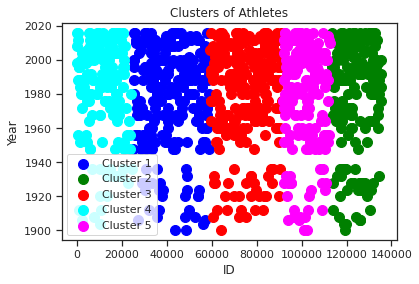

In [ ]:
#visulaizing the clusters based on id of the athletes corresponding to the sport
plt.scatter(x[y_pred == 0, 0], x[y_pred == 0, 1], s = 100, c = 'blue', label = 'Cluster 1')  
plt.scatter(x[y_pred == 1, 0], x[y_pred == 1, 1], s = 100, c = 'green', label = 'Cluster 2')  
plt.scatter(x[y_pred== 2, 0], x[y_pred == 2, 1], s = 100, c = 'red', label = 'Cluster 3')  
plt.scatter(x[y_pred == 3, 0], x[y_pred == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')  
plt.scatter(x[y_pred == 4, 0], x[y_pred == 4, 1], s = 100, c = 'magenta', label = 'Cluster 5')  
plt.title('Clusters of Athletes')  
plt.xlabel('ID')  
plt.ylabel('Year')  
plt.legend()  
plt.show()  

Merits An Demerits:
Agglomerative is a bottom-up approach, in which the algorithm starts with taking all data points as single clusters and merging them until one cluster is left.
We need not enter the cluster values every single time. It does not work very well on vast amounts of data or huge datasets.

Decision tree


In [ ]:
df3=df.copy()

In [ ]:
# importing libraries  
import numpy as np
import matplotlib.pyplot as plt  
import pandas as pd  

In [ ]:
df3.head()

,Name,Sex,Age,Height,Weight,Team,Year,Season,City,Sport,Event,Medal,region,SeasonSayı,SexSayı,BMI,HeightNorm,WeightNorm
0,A Dijiang,M,24.0,180.00,80.00,China,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,---,China,0,1,22.222222,0.486868,0.723780
1,A Lamusi,M,23.0,170.00,60.00,China,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,---,China,0,1,17.647059,-0.581317,-0.855145
2,Gunnar Nielsen Aaby,M,24.0,179.22,73.89,Denmark,1920,Summer,Antwerpen,Football,Football Men's Football,---,Denmark,0,1,20.614329,0.403550,0.241418
3,Edgar Lindenau Aabye,M,34.0,175.37,70.72,Denmark/Sweden,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,0,1,20.163084,-0.007702,-0.008842
4,Christine Jacoba Aaftink,F,21.0,185.00,82.00,Netherlands,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,---,Netherlands,1,0,22.162162,1.020961,0.881672


In [ ]:
#Extracting Independent and dependent Variable  
x= df3.iloc[:, [3,4]].values  
y= df3.iloc[:, 14].values  

In [ ]:
# Splitting the dataset into training and test set.  
from sklearn.model_selection import train_test_split  
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.25, random_state=0)

In [ ]:
#feature Scaling  
from sklearn.preprocessing import StandardScaler    
st_x= StandardScaler()  
x_train= st_x.fit_transform(x_train)    
x_test= st_x.transform(x_test)    

In [ ]:
#Fitting Decision Tree classifier to the training set  
from sklearn.tree import DecisionTreeClassifier  
classifier= DecisionTreeClassifier(criterion='entropy', random_state=0)  
classifier.fit(x_train, y_train)  

DecisionTreeClassifier(criterion='entropy', random_state=0)

In [ ]:
#Predicting the test set result  
y_pred= classifier.predict(x_test)  

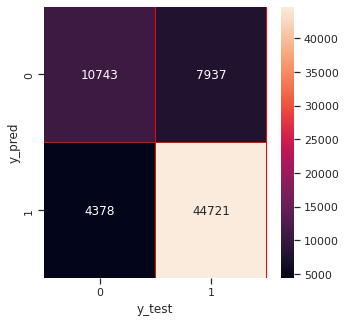

In [ ]:
#Creating the Confusion matrix  
from sklearn.metrics import confusion_matrix  
cm= confusion_matrix(y_test, y_pred)  

import seaborn as sns 
f, ax =plt.subplots(figsize = (5,5))

sns.heatmap(cm,annot = True, linewidths= 0.5, linecolor="red", fmt=".0f", ax=ax)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

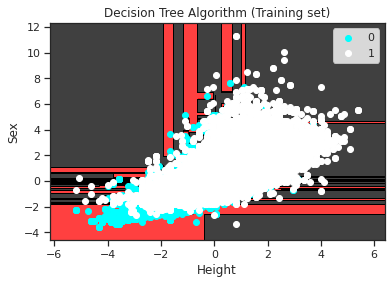

In [ ]:
#Visulaizing the trianing set result  
from matplotlib.colors import ListedColormap  
x_set, y_set = x_train, y_train  
x1, x2 = np.meshgrid(np.arange(start = x_set[:, 0].min() - 1, stop = x_set[:, 0].max() + 1, step  =0.01),  
np.arange(start = x_set[:, 1].min() - 1, stop = x_set[:, 1].max() + 1, step = 0.01))  
plt.contourf(x1, x2, classifier.predict(np.array([x1.ravel(), x2.ravel()]).T).reshape(x1.shape),  
alpha = 0.75, cmap = ListedColormap(('red','black' )))  
plt.xlim(x1.min(), x1.max())  
plt.ylim(x2.min(), x2.max())  
for i, j in enumerate(np.unique(y_set)):  
  plt.scatter(x_set[y_set == j, 0], x_set[y_set == j, 1],  
        c = ListedColormap(('cyan', 'white'))(i), label = j)  
plt.title('Decision Tree Algorithm (Training set)')  
plt.xlabel('Height')  
plt.ylabel('Sex')  
plt.legend()  
plt.show() 

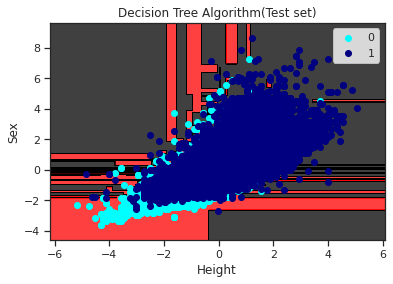

In [ ]:
#Visulaizing the test set result  
from matplotlib.colors import ListedColormap  
x_set, y_set = x_test, y_test  
x1, x2 = np.meshgrid(np.arange(start = x_set[:, 0].min() - 1, stop = x_set[:, 0].max() + 1, step  =0.01),  
np.arange(start = x_set[:, 1].min() - 1, stop = x_set[:, 1].max() + 1, step = 0.01))  
plt.contourf(x1, x2, classifier.predict(np.array([x1.ravel(), x2.ravel()]).T).reshape(x1.shape),  
alpha = 0.75, cmap = ListedColormap(('red','black' )))  
plt.xlim(x1.min(), x1.max())  
plt.ylim(x2.min(), x2.max())  
for i, j in enumerate(np.unique(y_set)):  
  plt.scatter(x_set[y_set == j, 0], x_set[y_set == j, 1],  
        c = ListedColormap(('cyan', 'navy'))(i), label = j)  
plt.title('Decision Tree Algorithm(Test set)')  
plt.xlabel('Height')  
plt.ylabel('Sex')  
plt.legend()  
plt.show()  

In [ ]:
clf = DecisionTreeClassifier(random_state=0)
model = clf.fit(x, y)

In [ ]:
from sklearn import tree
text_representation = tree.export_text(clf)
print(text_representation)

|--- feature_1 <= 63.03
|   |--- feature_1 <= 59.25
|   |   |--- feature_1 <= 50.50
|   |   |   |--- feature_1 <= 47.50
|   |   |   |   |--- feature_0 <= 176.42
|   |   |   |   |   |--- feature_0 <= 174.61
|   |   |   |   |   |   |--- feature_1 <= 46.50
|   |   |   |   |   |   |   |--- feature_0 <= 157.50
|   |   |   |   |   |   |   |   |--- feature_0 <= 145.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- feature_0 >  145.50
|   |   |   |   |   |   |   |   |   |--- feature_0 <= 147.50
|   |   |   |   |   |   |   |   |   |   |--- feature_1 <= 39.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |   |--- feature_1 >  39.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |--- feature_0 >  147.50
|   |   |   |   |   |   |   |   |   |   |--- feature_0 <= 150.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated b

In [ ]:
print(clf)

DecisionTreeClassifier(random_state=0)


In [ ]:

import graphviz
# DOT data
dot_data = tree.export_graphviz(clf, out_file=None,  filled=True)

# Draw graph

graph = graphviz.Source(dot_data, format="png",) 
graph

In [ ]:
graph.save("decision_tree.svg")

'decision_tree.svg'

In [ ]:
pip install dtreeviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 271116 entries, 0 to 271115
Data columns (total 18 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Name        271116 non-null  object 
 1   Sex         271116 non-null  object 
 2   Age         271116 non-null  float64
 3   Height      271116 non-null  float64
 4   Weight      271116 non-null  float64
 5   Team        271116 non-null  object 
 6   Year        271116 non-null  int64  
 7   Season      271116 non-null  object 
 8   City        271116 non-null  object 
 9   Sport       271116 non-null  object 
 10  Event       271116 non-null  object 
 11  Medal       271116 non-null  object 
 12  region      270746 non-null  object 
 13  SeasonSayı  271116 non-null  int8   
 14  SexSayı     271116 non-null  int8   
 15  BMI         271116 non-null  float64
 16  HeightNorm  271116 non-null  float64
 17  WeightNorm  271116 non-null  float64
dtypes: float64(6), int64(1), int8(2), object(9)


In [ ]:
#logistic regression

In [ ]:
df3=df.copy()

In [ ]:
df3.head()

,Name,Sex,Age,Height,Weight,Team,Year,Season,City,Sport,Event,Medal,region,SeasonSayı,SexSayı,BMI,HeightNorm,WeightNorm
0,A Dijiang,M,24.0,180.00,80.00,China,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,---,China,0,1,22.222222,0.486868,0.723780
1,A Lamusi,M,23.0,170.00,60.00,China,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,---,China,0,1,17.647059,-0.581317,-0.855145
2,Gunnar Nielsen Aaby,M,24.0,179.22,73.89,Denmark,1920,Summer,Antwerpen,Football,Football Men's Football,---,Denmark,0,1,20.614329,0.403550,0.241418
3,Edgar Lindenau Aabye,M,34.0,175.37,70.72,Denmark/Sweden,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,0,1,20.163084,-0.007702,-0.008842
4,Christine Jacoba Aaftink,F,21.0,185.00,82.00,Netherlands,1988,Winter,Calgary,Speed Skating,Speed Skating Women's 500 metres,---,Netherlands,1,0,22.162162,1.020961,0.881672


In [ ]:
#Extracting Independent and dependent Variable  
x= df3.iloc[:, [3,4]].values  
y= df3.iloc[:, 14].values  

In [ ]:
# Splitting the dataset into training and test set.  
from sklearn.model_selection import train_test_split  
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.25, random_state=0)  

In [ ]:
#feature Scaling  
from sklearn.preprocessing import StandardScaler    
st_x= StandardScaler()    
x_train= st_x.fit_transform(x_train)    
x_test= st_x.transform(x_test)  

In [ ]:
#Fitting Logistic Regression to the training set  
from sklearn.linear_model import LogisticRegression  
classifier= LogisticRegression(random_state=0)  
classifier.fit(x_train, y_train)  

LogisticRegression(random_state=0)

In [ ]:
#Predicting the test set result  
y_pred= classifier.predict(x_test)  

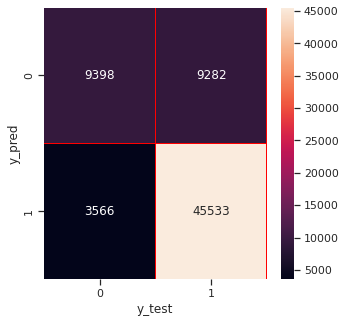

In [ ]:
#Creating the Confusion matrix  
from sklearn.metrics import confusion_matrix  
cm= confusion_matrix(y_test, y_pred)  

import seaborn as sns 
f, ax =plt.subplots(figsize = (5,5))

sns.heatmap(cm,annot = True, linewidths= 0.5, linecolor="red", fmt=".0f", ax=ax)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

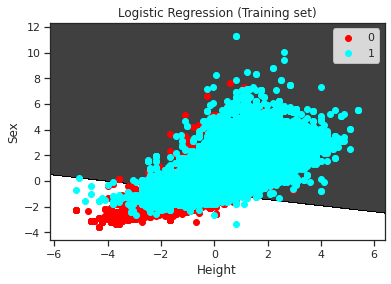

In [ ]:
#Visualizing the training set result  
from matplotlib.colors import ListedColormap  
x_set, y_set = x_train, y_train  
x1, x2 = np.meshgrid(np.arange(start = x_set[:, 0].min() - 1, stop = x_set[:, 0].max() + 1, step  =0.01),  
np.arange(start = x_set[:, 1].min() - 1, stop = x_set[:, 1].max() + 1, step = 0.01))  
plt.contourf(x1, x2, classifier.predict(np.array([x1.ravel(), x2.ravel()]).T).reshape(x1.shape),  
alpha = 0.75, cmap = ListedColormap(('white','black' )))  
plt.xlim(x1.min(), x1.max())  
plt.ylim(x2.min(), x2.max())  
for i, j in enumerate(np.unique(y_set)):  
    plt.scatter(x_set[y_set == j, 0], x_set[y_set == j, 1],  
        c = ListedColormap(('red', 'cyan'))(i), label = j)  
plt.title('Logistic Regression (Training set)')  
plt.xlabel('Height')  
plt.ylabel('Sex')  
plt.legend()  
plt.show()

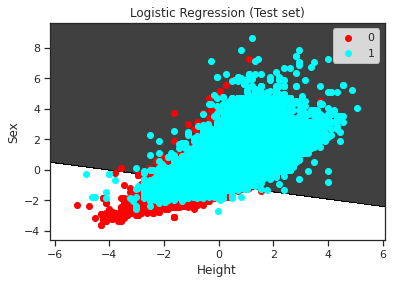

In [ ]:
#Visulaizing the test set result  
from matplotlib.colors import ListedColormap  
x_set, y_set = x_test, y_test  
x1, x2 = np.meshgrid(np.arange(start = x_set[:, 0].min() - 1, stop = x_set[:, 0].max() + 1, step  =0.01),  
np.arange(start = x_set[:, 1].min() - 1, stop = x_set[:, 1].max() + 1, step = 0.01))  
plt.contourf(x1, x2, classifier.predict(np.array([x1.ravel(), x2.ravel()]).T).reshape(x1.shape),  
alpha = 0.75, cmap = ListedColormap(('white','black' )))  
plt.xlim(x1.min(), x1.max())  
plt.ylim(x2.min(), x2.max())  
for i, j in enumerate(np.unique(y_set)):  
    plt.scatter(x_set[y_set == j, 0], x_set[y_set == j, 1],  
        c = ListedColormap(('red', 'cyan'))(i), label = j)  
plt.title('Logistic Regression (Test set)')  
plt.xlabel('Height')  
plt.ylabel('Sex')  
plt.legend()  
plt.show()  

In [ ]:
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(classifier.score(x_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.81


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.72      0.50      0.59     18680
           1       0.83      0.93      0.88     49099

    accuracy                           0.81     67779
   macro avg       0.78      0.72      0.74     67779
weighted avg       0.80      0.81      0.80     67779



In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logreg = LogisticRegression()

In [ ]:
#cross validation

In [ ]:
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
kfold = model_selection.KFold(n_splits=10,)
modelCV = LogisticRegression()
scoring = 'accuracy'
results = model_selection.cross_val_score(modelCV, x_train, y_train, cv=kfold, scoring=scoring)
print("10-fold cross validation average accuracy: %.3f" % (results.mean()))

10-fold cross validation average accuracy: 0.809


In [ ]:
#confusion matrix
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[ 9398  9282]
 [ 3566 45533]]


In [ ]:
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(classifier.score(x_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.81
